In [2]:
import pandas as pd
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
from dnn_utils_v2 import sigmoid, sigmoid_backward, relu, relu_backward
from sklearn.model_selection import train_test_split
from tensorflow.keras.layers import Dense, BatchNormalization, Dropout


In [3]:
data = pd.read_csv('train.csv')

In [4]:
data.head()

,image,category
0,2823080.jpg,1
1,2870024.jpg,1
2,2662125.jpg,2
3,2900420.jpg,3
4,2804883.jpg,2


In [5]:
pip install opencv-python

Note: you may need to restart the kernel to use updated packages.


In [5]:
import cv2

In [6]:
sum(data['category']==1)

2120

In [7]:
data_x = data['image']
labels = data['category'].replace({1:1,2:0,3:0,4:0,5:0})

In [8]:
labels.unique()

array([1, 0])

In [50]:
# splitting the traindata into training and validation data
train_X,valid_X,train_Y,valid_Y = train_test_split(data_x,labels,test_size=0.2,train_size=0.8)

In [51]:
def pre_process(data): 
    data = data
    #x = np.array(data['image'])
    #la = np.array(data['category'])
    new = []
    for i in data:
        y = cv2.imread(i , 1)
        res = cv2.resize(y , (15,8))
        new.append(res)
    new = np.array(new)
    print(data.info())
    print(data.describe())
    return new

In [52]:
train_x = pre_process(train_X)

<class 'pandas.core.series.Series'>
Int64Index: 5001 entries, 1424 to 5339
Series name: image
Non-Null Count  Dtype 
--------------  ----- 
5001 non-null   object
dtypes: object(1)
memory usage: 78.1+ KB
None
count            5001
unique           5001
top       2731093.jpg
freq                1
Name: image, dtype: object


In [53]:
train_x.shape

(5001, 8, 15, 3)

In [16]:
train_y = train_Y.values

In [21]:
import tensorflow as tf

In [25]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Flatten, Dropout 
from tensorflow.keras import regularizers
from tensorflow.keras.callbacks import Callback
from tensorflow.keras.preprocessing import image
from tensorflow.keras.layers import Conv2D, MaxPooling2D
from tensorflow.keras.callbacks import ModelCheckpoint

In [273]:
model_cnn = Sequential([
 Conv2D(6, (3, 3), activation='relu', input_shape=(8, 15,3)),
 MaxPooling2D(pool_size=(2,2), strides=(1,1), padding='valid'),
 Conv2D(6, (3, 3), activation='relu'),
 MaxPooling2D(pool_size=(2,2), strides=(1,1), padding='valid'),
 Flatten(),
 Dense(4, activation='relu'),
 Dense(1, activation='sigmoid')
])

In [274]:
model_cnn.compile(optimizer='adam',
 loss='binary_crossentropy',
 metrics=['accuracy'])

In [275]:
checkpoint_path_cnn = 'cnn_checkpoints/checkpoint'
# Define the ModelCheckpoint callback
checkpoint_cnn = ModelCheckpoint(filepath=checkpoint_path_cnn,
 save_freq='epoch',
 save_weights_only=True,
 verbose=1)

In [276]:
history = model_cnn.fit( train_x, train_y, epochs = 100, validation_split = 0.15,batch_size = 256, verbose = 2,
                       callbacks=[checkpoint_cnn])

Epoch 1/100

Epoch 1: saving model to cnn_checkpoints/checkpoint
17/17 - 0s - loss: 2.7743 - accuracy: 0.4054 - val_loss: 0.6743 - val_accuracy: 0.6778 - 479ms/epoch - 28ms/step
Epoch 2/100

Epoch 2: saving model to cnn_checkpoints/checkpoint
17/17 - 0s - loss: 0.6650 - accuracy: 0.6631 - val_loss: 0.6477 - val_accuracy: 0.6778 - 141ms/epoch - 8ms/step
Epoch 3/100

Epoch 3: saving model to cnn_checkpoints/checkpoint
17/17 - 0s - loss: 0.6457 - accuracy: 0.6628 - val_loss: 0.6387 - val_accuracy: 0.6778 - 131ms/epoch - 8ms/step
Epoch 4/100

Epoch 4: saving model to cnn_checkpoints/checkpoint
17/17 - 0s - loss: 0.6455 - accuracy: 0.6628 - val_loss: 0.6376 - val_accuracy: 0.6778 - 112ms/epoch - 7ms/step
Epoch 5/100

Epoch 5: saving model to cnn_checkpoints/checkpoint
17/17 - 0s - loss: 0.6439 - accuracy: 0.6628 - val_loss: 0.6369 - val_accuracy: 0.6778 - 113ms/epoch - 7ms/step
Epoch 6/100

Epoch 6: saving model to cnn_checkpoints/checkpoint
17/17 - 0s - loss: 0.6429 - accuracy: 0.6628 - va

Epoch 47/100

Epoch 47: saving model to cnn_checkpoints/checkpoint
17/17 - 0s - loss: 0.6253 - accuracy: 0.6628 - val_loss: 0.6141 - val_accuracy: 0.6764 - 104ms/epoch - 6ms/step
Epoch 48/100

Epoch 48: saving model to cnn_checkpoints/checkpoint
17/17 - 0s - loss: 0.6246 - accuracy: 0.6628 - val_loss: 0.6155 - val_accuracy: 0.6778 - 104ms/epoch - 6ms/step
Epoch 49/100

Epoch 49: saving model to cnn_checkpoints/checkpoint
17/17 - 0s - loss: 0.6314 - accuracy: 0.6628 - val_loss: 0.6150 - val_accuracy: 0.6764 - 120ms/epoch - 7ms/step
Epoch 50/100

Epoch 50: saving model to cnn_checkpoints/checkpoint
17/17 - 0s - loss: 0.6254 - accuracy: 0.6628 - val_loss: 0.6144 - val_accuracy: 0.6764 - 116ms/epoch - 7ms/step
Epoch 51/100

Epoch 51: saving model to cnn_checkpoints/checkpoint
17/17 - 0s - loss: 0.6233 - accuracy: 0.6628 - val_loss: 0.6255 - val_accuracy: 0.6764 - 105ms/epoch - 6ms/step
Epoch 52/100

Epoch 52: saving model to cnn_checkpoints/checkpoint
17/17 - 0s - loss: 0.6219 - accuracy: 

Epoch 93/100

Epoch 93: saving model to cnn_checkpoints/checkpoint
17/17 - 0s - loss: 0.5993 - accuracy: 0.6835 - val_loss: 0.5890 - val_accuracy: 0.7150 - 104ms/epoch - 6ms/step
Epoch 94/100

Epoch 94: saving model to cnn_checkpoints/checkpoint
17/17 - 0s - loss: 0.5978 - accuracy: 0.6864 - val_loss: 0.5890 - val_accuracy: 0.7097 - 101ms/epoch - 6ms/step
Epoch 95/100

Epoch 95: saving model to cnn_checkpoints/checkpoint
17/17 - 0s - loss: 0.5957 - accuracy: 0.6887 - val_loss: 0.5884 - val_accuracy: 0.7004 - 99ms/epoch - 6ms/step
Epoch 96/100

Epoch 96: saving model to cnn_checkpoints/checkpoint
17/17 - 0s - loss: 0.5987 - accuracy: 0.6781 - val_loss: 0.5856 - val_accuracy: 0.7084 - 103ms/epoch - 6ms/step
Epoch 97/100

Epoch 97: saving model to cnn_checkpoints/checkpoint
17/17 - 0s - loss: 0.5975 - accuracy: 0.6833 - val_loss: 0.5914 - val_accuracy: 0.7164 - 104ms/epoch - 6ms/step
Epoch 98/100

Epoch 98: saving model to cnn_checkpoints/checkpoint
17/17 - 0s - loss: 0.5950 - accuracy: 0

In [277]:
df2 = pd.DataFrame(history.history)

In [278]:
df2.sort_values(by=['accuracy','val_accuracy'],ascending=False)

,loss,accuracy,val_loss,val_accuracy
99,0.597456,0.691765,0.586624,0.703063
97,0.594982,0.690588,0.583991,0.711052
98,0.592463,0.690588,0.583665,0.705726
94,0.595718,0.688706,0.588415,0.700399
91,0.601453,0.688000,0.589245,0.709720
...,...,...,...,...
55,0.618108,0.662824,0.624418,0.676431
56,0.618257,0.662824,0.617813,0.676431
57,0.617180,0.662824,0.615577,0.676431
78,0.608892,0.662588,0.593414,0.677763


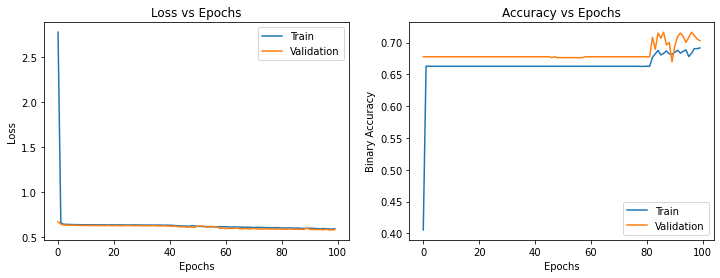

In [279]:
# Plot the training and validation loss
frame = pd.DataFrame(history.history)
epochs = np.arange(len(frame))
fig = plt.figure(figsize=(12,4))
# Loss plot
ax = fig.add_subplot(121)
ax.plot(epochs, frame['loss'], label="Train")
ax.plot(epochs, frame['val_loss'], label="Validation")
ax.set_xlabel("Epochs")
ax.set_ylabel("Loss")
ax.set_title("Loss vs Epochs")
ax.legend()
# Accuracy plot
ax = fig.add_subplot(122)
ax.plot(epochs, frame['accuracy'], label="Train")
ax.plot(epochs, frame['val_accuracy'], label="Validation")
ax.set_xlabel("Epochs")
ax.set_ylabel("Binary Accuracy")
ax.set_title("Accuracy vs Epochs")
ax.legend()

In [19]:
from init_utils import sigmoid, relu, compute_loss, forward_propagation, backward_propagation
from init_utils import update_parameters, load_dataset,predict, plot_decision_boundary, predict_dec

In [313]:
model2 = Sequential([
 Conv2D(6, (3, 3), activation='relu', input_shape=(8, 15,3)),
 MaxPooling2D(pool_size=(2,2), strides=(1,1), padding='valid'),
 Conv2D(6, (3, 3), activation='relu'),
 MaxPooling2D(pool_size=(2,2), strides=(1,1), padding='valid'),
 Flatten(),
 Dense(4, activation='relu'),
 Dense(1, activation='sigmoid')
])

In [314]:
model2.compile(optimizer='adam',
 loss='binary_crossentropy',
 metrics=['accuracy'])

In [315]:
model2.load_weights(checkpoint_path_cnn)

In [38]:
test_data = pd.read_csv('test.csv')
x = test_data['image']
test_x = []
for i in x:
    y = cv2.imread(i , 1)
    res = cv2.resize(y , (15,8))
    test_x.append(res)
test_x = np.array(test_x)

In [318]:
test_x.shape

(2680, 8, 15, 3)

84/84 [==============================] - 0s 808us/step


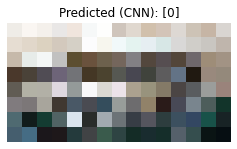

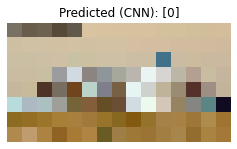

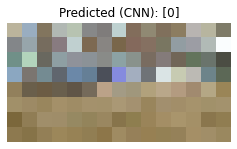

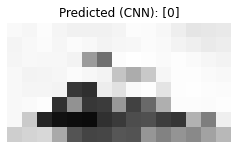

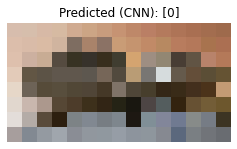

...

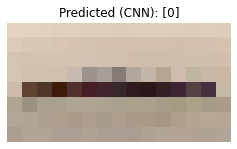

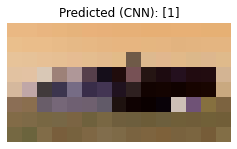

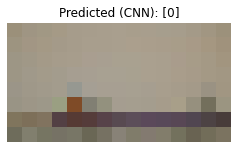

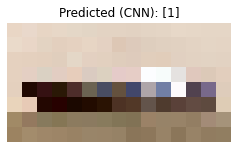

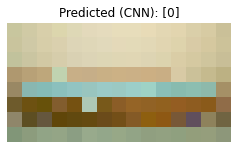

In [341]:
model2_preds = model2.predict(test_x)
model2_preds = np.where(model2_preds > 0.5, 1, 0)
for i in range(test_x.shape[0]):
    plt.figure(figsize=(4,4))
    plt.imshow(test_x[i])
    plt.title(f"Predicted (CNN): {model2_preds[i]}")
    plt.axis('off')
    plt.show()

In [41]:
test_labels = pd.read_excel('test_labels.xlsx')

In [42]:
np.sum(model2_preds.reshape(2680)!=np.array(test_labels['category']))

913